# Data Visualization Workshop
- 游騰林 tlyu0419
- 2022-11-15 13:18:53
- https://colab.research.google.com/drive/1tUSsZ5Q67evCQd4eJz0Fx2MvyUCwR8lF

## Build Enviroment

In [1]:
!git init

Initialized empty Git repository in /content/.git/


In [2]:
!git pull https://github.com/TLYu0419/data_visualization_workshop.git

remote: Enumerating objects: 30, done.
remote: Counting objects: 100% (30/30), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 30 (delta 4), reused 24 (delta 1), pack-reused 0
Unpacking objects: 100% (30/30), done.
From https://github.com/TLYu0419/data_visualization_workshop
 * branch            HEAD       -> FETCH_HEAD


In [3]:
pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 85 kB 2.9 MB/s 
     |████████████████████████████████| 7.6 MB 36.6 MB/s 
     |████████████████████████████████| 5.5 MB 48.6 MB/s 
     |████████████████████████████████| 149 kB 53.3 MB/s 
     |████████████████████████████████| 1.3 MB 52.4 MB/s 
     |████████████████████████████████| 182 kB 56.0 MB/s 
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125938 sha256=6075296b9c754f16a1f4a2fc800329e01a938b810e5776f5052b90dc70327628
  Stored in directory: /root/.cache/pip/wheels/bf/06/fb/d59c1e5bd1dac7f6cf61ec0036cc3a10ab8fecaa6b2c3d3ee9
  Created wheel for sklearn: filename=sklearn-0.0.post1-py3-none-any.whl size=2344 sha256=916e4a965aa794498099def2cc43c600cda12b259504ee932a106b947cd2e49b
  Stored in directory: /root/.cache/pip/wheels/42/56/cc/4a8bf86613aafd5b7f1b310477667c1fca5c51c3ae4124a003
Succe

## Import packages

In [4]:
import re

import json

import jieba

import numpy as np
import pandas as pd

import datetime 

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.manifold import TSNE

import seaborn as sns
import matplotlib.pyplot as plt

from wordcloud import WordCloud
from dict.udf_dict import udf_dict, stop_words, deps

from sentence_transformers import SentenceTransformer, util

plt.rcParams['axes.unicode_minus'] = False

## Utils

In [5]:
def _extract_reactions(reactions, reaction_type):
    '''
    Extract reaction_type from reactions.
    Possible reaction_type's value will be one of ['LIKE', 'HAHA', 'WOW', 'LOVE', 'SUPPORT', 'SORRY', 'ANGER'] 
    '''
    for reaction in reactions:
        if reaction['node']['localized_name'].upper() == reaction_type.upper():
            return reaction['reaction_count']
    return 0

In [9]:
def plot_wordcloud(word_dict):
    wordcloud =  WordCloud(font_path='./font/msjh.ttc',
                           width=1000,
                           height=700,
                           max_words=80,
                           min_font_size=3,
                           background_color="white")
    wordcloud = wordcloud.generate_from_frequencies(word_dict)
    plt.figure(figsize=(9, 6), dpi=160)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.grid(None)
    plt.axis("off")

## Load data

In [10]:
df = pd.read_excel('./data/hatendhu_posts.xlsx')
df['REACTIONS'] = df['REACTIONS'].apply(lambda x: eval(x))
print(df.shape)
df.head()

(11468, 17)


,NAME,PAGEID,POSTID,TIME,MESSAGE,ATTACHMENT_TITLE,ATTACHMENT_DESCRIPTION,ATTACHMENT_PHOTOS,REACTIONCOUNT,COMMENTCOUNT,DISPLAYCOMMENTCOUNT,SHARECOUNT,REACTIONS,CURSOR,ACTOR_URL,POST_URL,UPDATETIME
0,黑特東華 NDHU Hate,100064708507691,302679573270710,2014-11-11 18:51:05,NaN,NaN,NaN,NaN,17,0,0,0,"[{'reaction_count': 17, 'node': {'id': '163585...",AQHRCgD9SpZOjNtn5vp5pqVyWQ7hDMTaKH1Tbbcc_3Nr2M...,https://www.facebook.com/hatendhu,https://www.facebook.com/hatendhu/posts/302679...,2022-10-28 00:54:11
1,黑特東華 NDHU Hate,100064708507691,302894876582513,2014-11-12 12:17:25,NaN,NaN,NaN,https://scontent.ftpe10-1.fna.fbcdn.net/v/t1.1...,3,0,0,0,"[{'reaction_count': 3, 'node': {'id': '1635855...",AQHRnrotlm9LeTJKF1ce2mFhxjWbWMIayr9jLjQmVHTKGR...,https://www.facebook.com/hatendhu,https://www.facebook.com/hatendhu/posts/302894...,2022-10-28 00:54:11
2,黑特東華 NDHU Hate,100064708507691,302949503243717,2014-11-12 18:00:50,【公告】\n小編尚未完成招募管理員，\n也不是原靠北東華的管理員\n小編我只是想要開放個空間...,NaN,NaN,NaN,8,0,0,0,"[{'reaction_count': 8, 'node': {'id': '1635855...",AQHRsihclL2i-m1CxRQayZAEfZ_jTX4TZ4_tx_A0GeYA0q...,https://www.facebook.com/hatendhu,https://www.facebook.com/hatendhu/posts/pfbid0...,2022-10-28 00:54:11
3,黑特東華 NDHU Hate,100064708507691,306667499538584,2014-11-26 02:36:44,https://www.ptt.cc/bbs/Gossiping/M.1416938836....,Re: [爆卦] 超沒品的廣告 (下),看完這支廣告 就知道票一定要投給柯文哲,NaN,22,2,2,0,"[{'reaction_count': 22, 'node': {'id': '163585...",AQHRSbhiR49ggH54QaVpE5J6mM_8tqzl8PVgQ6VVMdlRDd...,https://www.facebook.com/hatendhu,https://www.facebook.com/hatendhu/posts/306667...,2022-10-28 00:54:11
4,黑特東華 NDHU Hate,100064708507691,306958996176101,2014-11-27 02:28:15,今天深夜就到此為止，小編我該睡了...\n下次更新應該是今天中午吃飯吧\n各位也早點睡吧，小...,熬夜增泌乳素 30歲男不舉 | 蘋果日報,【蔡明樺╱台北報導】當慣夜貓族，恐成不舉男。一名三十歲壯男長期熬夜、常凌晨二時後才睡覺，一個...,NaN,24,1,1,0,"[{'reaction_count': 24, 'node': {'id': '163585...",AQHRnEAwyBDE3K1RlHbtXoZ11dwHuxJZ5qZJkfsuyCHujc...,https://www.facebook.com/hatendhu,https://www.facebook.com/hatendhu/posts/306958...,2022-10-28 00:54:11


## EDA

In [11]:
ndf = df[['REACTIONS']].explode('REACTIONS')
print(ndf.shape)
ndf = ndf.loc[ndf['REACTIONS'].notnull()]
print(ndf.shape)
ndf['reaction_type'] = ndf['REACTIONS'].apply(lambda x: x['node']['localized_name'])
ndf['reaction_type'].value_counts()

(24086, 1)
(24077, 1)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


Like        11459
Haha         3715
Wow          3122
Sad          1944
Love         1585
Care         1176
Angry        1047
Thankful       15
Pride          14
Name: reaction_type, dtype: int64

In [12]:
ndf = df[['REACTIONS']].explode('REACTIONS')
print(ndf.shape)
ndf = ndf.loc[ndf['REACTIONS'].notnull()]
print(ndf.shape)
ndf['reaction_type'] = ndf['REACTIONS'].apply(lambda x: x['node']['localized_name'])
ndf['reaction_type'].value_counts()

(24086, 1)
(24077, 1)


Like        11459
Haha         3715
Wow          3122
Sad          1944
Love         1585
Care         1176
Angry        1047
Thankful       15
Pride          14
Name: reaction_type, dtype: int64

In [13]:
df['LIKE'] = df['REACTIONS'].apply(lambda x: _extract_reactions(x, 'Like'))
df['HAHA'] = df['REACTIONS'].apply(lambda x: _extract_reactions(x, 'Haha'))
df['WOW']  = df['REACTIONS'].apply(lambda x: _extract_reactions(x, 'Wow'))
df['SAD']  = df['REACTIONS'].apply(lambda x: _extract_reactions(x, 'Sad'))
df['LOVE'] = df['REACTIONS'].apply(lambda x: _extract_reactions(x, 'Love'))
df['CARE'] = df['REACTIONS'].apply(lambda x: _extract_reactions(x, 'Care'))

In [14]:
ndf = df[['POSTID', 'MESSAGE', 'LIKE', 'HAHA', 'WOW', 'SAD', 'LOVE', 'CARE', 'COMMENTCOUNT', 'SHARECOUNT']]
ndf = ndf.set_index(['POSTID', 'MESSAGE']).stack().reset_index()
ndf = ndf.rename({'level_2':'REACTION_TYPE', 0:'CNT'}, axis=1)
ndf = ndf.sort_values('CNT', ascending=False)
ndf = ndf.groupby(['REACTION_TYPE']).head(1)
ndf.sort_values(['REACTION_TYPE', 'CNT'],ascending = [True, False])

,POSTID,MESSAGE,REACTION_TYPE,CNT
85989,1810914805780505,#52089\n\n我真的每天都不開心了。\n\n從事情開始到現在，我一直都沒有公開在黑特上...,CARE,154
87158,1862359323969386,#52249\n\n徵 ‘’純‘’陪睡人員\n時薪：200元\n條件：不會打呼、不會磨牙、不...,COMMENTCOUNT,879
87249,1863745383830780,#52261\n\n行雲一莊217前任房主，你家的加藤惠忘記帶走了，請到行雲管理室認領,HAHA,260
20608,723195971219066,#21739\n\n請問東華除了鴿子\n還有誰在養羊嗎？\n在原民院的草皮上\n東華農場？\...,LIKE,1031
31172,886957661509562,#27518\n\n深夜在校園遇到一隻可愛的貓貓，希望不是走失的,LOVE,66
72003,1650577585147562,#49512\n\n關於大虎的事情，還是有些事情真的讓人無法忍住不說：\n 在昨...,SAD,448
91191,482969590536654,#52754\n\n法氓再次於東華大學版dcard征戰，\n口誅筆伐，劍鋒直指校長。,SHARECOUNT,112
67066,1539699272902061,#47527\n\n就在今天，我在管院外被十幾隻蜜蜂咬了！痛到我一直哭，手整個腫起來，也只能...,WOW,175


# Preprocessing

In [15]:
ndf = df[['NAME', 'POSTID', 'TIME', 'MESSAGE', 'ATTACHMENT_TITLE', 'ATTACHMENT_DESCRIPTION']].copy()
print(ndf.shape)

(11468, 6)


In [16]:
condlist = [
    ndf['TIME'].apply(lambda x: '2014-08-01' <= x[:10] <= '2015-01-31'), # 103
    ndf['TIME'].apply(lambda x: '2015-02-01' <= x[:10] <= '2015-07-31'),
    ndf['TIME'].apply(lambda x: '2015-08-01' <= x[:10] <= '2016-01-31'), # 104
    ndf['TIME'].apply(lambda x: '2016-02-01' <= x[:10] <= '2016-07-31'),
    ndf['TIME'].apply(lambda x: '2016-08-01' <= x[:10] <= '2017-01-31'), # 105
    ndf['TIME'].apply(lambda x: '2017-02-01' <= x[:10] <= '2017-07-31'),
    ndf['TIME'].apply(lambda x: '2017-08-01' <= x[:10] <= '2018-01-31'), # 106
    ndf['TIME'].apply(lambda x: '2018-02-01' <= x[:10] <= '2018-07-31'),
    ndf['TIME'].apply(lambda x: '2018-08-01' <= x[:10] <= '2019-01-31'), # 107
    ndf['TIME'].apply(lambda x: '2019-02-01' <= x[:10] <= '2019-07-31'),
    ndf['TIME'].apply(lambda x: '2019-08-01' <= x[:10] <= '2020-01-31'), # 108
    ndf['TIME'].apply(lambda x: '2020-02-01' <= x[:10] <= '2020-07-31'),
    ndf['TIME'].apply(lambda x: '2020-08-01' <= x[:10] <= '2021-01-31'), # 109
    ndf['TIME'].apply(lambda x: '2021-02-01' <= x[:10] <= '2021-07-31'),
    ndf['TIME'].apply(lambda x: '2021-08-01' <= x[:10] <= '2022-01-31'), # 110
    ndf['TIME'].apply(lambda x: '2022-02-01' <= x[:10] <= '2022-07-31'),
    ndf['TIME'].apply(lambda x: '2022-08-01' <= x[:10] <= '2023-01-31') # 111
    ]
choicelist = ['S103-1', 'S103-2', 'S104-1', 'S104-2', 'S105-1', 'S105-2', 'S106-1', 'S106-2', 'S107-1', 'S107-2', 
              'S108-1', 'S108-2', 'S109-1', 'S109-2', 'S110-1', 'S110-2', 'S111-1']
ndf['SEMESTER'] = np.select(condlist, choicelist)
ndf.head()

,NAME,POSTID,TIME,MESSAGE,ATTACHMENT_TITLE,ATTACHMENT_DESCRIPTION,SEMESTER
0,黑特東華 NDHU Hate,302679573270710,2014-11-11 18:51:05,NaN,NaN,NaN,S103-1
1,黑特東華 NDHU Hate,302894876582513,2014-11-12 12:17:25,NaN,NaN,NaN,S103-1
2,黑特東華 NDHU Hate,302949503243717,2014-11-12 18:00:50,【公告】\n小編尚未完成招募管理員，\n也不是原靠北東華的管理員\n小編我只是想要開放個空間...,NaN,NaN,S103-1
3,黑特東華 NDHU Hate,306667499538584,2014-11-26 02:36:44,https://www.ptt.cc/bbs/Gossiping/M.1416938836....,Re: [爆卦] 超沒品的廣告 (下),看完這支廣告 就知道票一定要投給柯文哲,S103-1
4,黑特東華 NDHU Hate,306958996176101,2014-11-27 02:28:15,今天深夜就到此為止，小編我該睡了...\n下次更新應該是今天中午吃飯吧\n各位也早點睡吧，小...,熬夜增泌乳素 30歲男不舉 | 蘋果日報,【蔡明樺╱台北報導】當慣夜貓族，恐成不舉男。一名三十歲壯男長期熬夜、常凌晨二時後才睡覺，一個...,S103-1


In [17]:
# 換大頭貼，封面照
ndf = ndf.loc[ndf['MESSAGE'].notnull()].reset_index(drop=True)

# Upper
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: x.upper())

print(ndf.shape)

(11447, 7)


In [18]:
# System number for post
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub(r'#[0-9]{4,6}', '', x))
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub('\n', ' ', x))

# 編號: 黑特東華NDHUHATE15
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub('#黑特東華NDHUHATE[0-9]{1,}', '', x))


# remove urls
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub(r'((https|http)?:\/\/)\S+', '', x))

# remove datetime log
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub(r' SUBMITTED.*? CST$', '', x))
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub(r' 提交日期.*? CST$', '', x))
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub(r' 投稿日期.*? CST$', '', x))

# remove white space
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub('^ {1,}', '', x))
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub(' {1,}$', '', x))
ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub(' {1,}', ' ', x))

# Keep only chinese, english and numbers 
# ndf['MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub('[^\u4e00-\u9fa5_A-Za-z0-9]', ' ', x))

ndf = ndf[['NAME', 'POSTID', 'TIME', 'SEMESTER', 'MESSAGE']].copy()
# 黑特東華NDHUHATE15
print(ndf.shape)
ndf.head()

(11447, 5)


,NAME,POSTID,TIME,SEMESTER,MESSAGE
0,黑特東華 NDHU Hate,302949503243717,2014-11-12 18:00:50,S103-1,【公告】 小編尚未完成招募管理員， 也不是原靠北東華的管理員 小編我只是想要開放個空間讓大家...
1,黑特東華 NDHU Hate,306667499538584,2014-11-26 02:36:44,S103-1,HTTPS 本版首次PO文 感覺這個實在太經典了必須要宣傳 一個用哀鳳6普拉蘇+MACBOO...
2,黑特東華 NDHU Hate,306958996176101,2014-11-27 02:28:15,S103-1,今天深夜就到此為止，小編我該睡了... 下次更新應該是今天中午吃飯吧 各位也早點睡吧，小心長...
3,黑特東華 NDHU Hate,307082916163709,2014-11-27 15:24:29,S103-1,有兩篇文我可能要慢點PO，一篇是批評的，一篇是鼓勵的， 我本來已經打完回文了，結果瀏覽器當掉...
4,黑特東華 NDHU Hate,307216386150362,2014-11-28 00:56:55,S103-1,.


# Doc vector

In [19]:
model = SentenceTransformer('distiluse-base-multilingual-cased-v2')
sentences = ndf['MESSAGE'].to_list()
sentence_embeddings = model.encode(sentences)

Downloading:   0%|          | 0.00/690 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/114 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.58M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.38k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/610 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/539M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.96M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/531 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/996k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/341 [00:00<?, ?B/s]

In [23]:
ndf['DOC_VECTORS'] = list(sentence_embeddings)
ndf = ndf.loc[ndf['DOC_VECTORS'].notnull()]
print(ndf.shape)
ndf.head()

(11447, 6)


,NAME,POSTID,TIME,SEMESTER,MESSAGE,DOC_VECTORS
0,黑特東華 NDHU Hate,302949503243717,2014-11-12 18:00:50,S103-1,【公告】 小編尚未完成招募管理員， 也不是原靠北東華的管理員 小編我只是想要開放個空間讓大家...,"[0.005477744, 0.015001315, 0.0019111349, -0.03..."
1,黑特東華 NDHU Hate,306667499538584,2014-11-26 02:36:44,S103-1,HTTPS 本版首次PO文 感覺這個實在太經典了必須要宣傳 一個用哀鳳6普拉蘇+MACBOO...,"[0.025548734, -0.002313375, 0.002165694, -0.03..."
2,黑特東華 NDHU Hate,306958996176101,2014-11-27 02:28:15,S103-1,今天深夜就到此為止，小編我該睡了... 下次更新應該是今天中午吃飯吧 各位也早點睡吧，小心長...,"[-0.013327825, -0.0108643025, -0.022029862, -0..."
3,黑特東華 NDHU Hate,307082916163709,2014-11-27 15:24:29,S103-1,有兩篇文我可能要慢點PO，一篇是批評的，一篇是鼓勵的， 我本來已經打完回文了，結果瀏覽器當掉...,"[-0.0055674473, 0.02252651, -0.041936122, -0.0..."
4,黑特東華 NDHU Hate,307216386150362,2014-11-28 00:56:55,S103-1,.,"[0.022658793, -0.0036188, -0.033782687, -0.043..."


# Cluster

In [24]:
X = [i for i in ndf['DOC_VECTORS']]
for num in range(5, 105, 5):
    km = KMeans(n_clusters=num, n_init=30, max_iter=2000, random_state=32).fit(X)
    
    if num != 5:
        diff_loss = inertia - km.inertia_
    else:
        diff_loss = 0
    inertia = km.inertia_
    print(f'Cluster size :{num} || inertia: {km.inertia_} || diff_loss: {diff_loss}')

Cluster size :5 || inertia: 4276.186617795163|| diff_loss: 0
Cluster size :10 || inertia: 4105.2879106304335|| diff_loss: 170.89870716472979
Cluster size :15 || inertia: 4007.151307588846|| diff_loss: 98.13660304158748
Cluster size :20 || inertia: 3935.2635907354147|| diff_loss: 71.88771685343136
Cluster size :25 || inertia: 3879.367683890452|| diff_loss: 55.89590684496261
Cluster size :30 || inertia: 3827.732208957229|| diff_loss: 51.63547493322312
Cluster size :35 || inertia: 3789.3256239057077|| diff_loss: 38.40658505152123
Cluster size :40 || inertia: 3751.7914136746053|| diff_loss: 37.534210231102406
Cluster size :45 || inertia: 3721.0939827866696|| diff_loss: 30.697430887935752
Cluster size :50 || inertia: 3694.647530977886|| diff_loss: 26.446451808783422
Cluster size :55 || inertia: 3664.1714359653024|| diff_loss: 30.476095012583755
Cluster size :60 || inertia: 3644.052753874863|| diff_loss: 20.118682090439506
Cluster size :65 || inertia: 3625.6107785198|| diff_loss: 18.44197535

In [25]:
X = ndf['DOC_VECTORS'].to_list()
km = KMeans(n_clusters=40,  n_init=50, random_state=32, init='random', max_iter=1000).fit(X)
ndf['CLUSTER_NUM'] = km.predict(X)
ndf.sort_values('CLUSTER_NUM').head(5)

,NAME,POSTID,TIME,SEMESTER,MESSAGE,DOC_VECTORS,CLUSTER_NUM
3818,黑特東華 NDHU Hate,883169828555012,2018-12-03 14:33:37,S107-1,有沒有人有在玩PTCG的啊？ 身邊沒人玩都只能玩線上版QQ,"[-0.022319166, -0.02079838, 0.040800005, -0.00...",0
8131,黑特東華 NDHU Hate,1516866088518713,2021-04-30 18:43:04,S109-2,退選了是不會說一下嗎？期中報告我們只有兩個人，密你也不回，人不是這樣做的吧？,"[-0.004978945, 0.016174853, 0.026905598, -0.04...",0
6849,黑特東華 NDHU Hate,1351163755088948,2020-09-15 21:46:32,S109-1,請問有人知道退宿的家長同意書在哪裡下載嗎🥺 翻好久都找不到,"[-0.010199805, 0.0058862446, 0.007361182, -0.0...",0
914,黑特東華 NDHU Hate,596685540536777,2017-05-07 10:17:52,S105-2,非黑特 純粹好奇在白趴喝ㄎㄧㄤ的人有多少?,"[0.012180709, 0.018069904, -0.005722958, -0.01...",0
4403,黑特東華 NDHU Hate,944623855742942,2019-03-23 18:48:04,S107-2,黑特 呼呼鍋 可以不要播垃圾新聞台嗎？ 吃個飯港覺渾身藍瘦,"[-0.049170673, 0.015730804, 0.036718775, -0.00...",0


In [26]:
ndf.to_pickle('HateNDHU_Clustering.pkl')
ndf.to_excel('HateNDHU_Clustering.xlsx', index=False)
ndf = pd.read_pickle('HateNDHU_Clustering.pkl')
print(ndf.shape)
ndf.head()

(11447, 7)


,NAME,POSTID,TIME,SEMESTER,MESSAGE,DOC_VECTORS,CLUSTER_NUM
0,黑特東華 NDHU Hate,302949503243717,2014-11-12 18:00:50,S103-1,【公告】 小編尚未完成招募管理員， 也不是原靠北東華的管理員 小編我只是想要開放個空間讓大家...,"[0.005477744, 0.015001315, 0.0019111349, -0.03...",15
1,黑特東華 NDHU Hate,306667499538584,2014-11-26 02:36:44,S103-1,HTTPS 本版首次PO文 感覺這個實在太經典了必須要宣傳 一個用哀鳳6普拉蘇+MACBOO...,"[0.025548734, -0.002313375, 0.002165694, -0.03...",20
2,黑特東華 NDHU Hate,306958996176101,2014-11-27 02:28:15,S103-1,今天深夜就到此為止，小編我該睡了... 下次更新應該是今天中午吃飯吧 各位也早點睡吧，小心長...,"[-0.013327825, -0.0108643025, -0.022029862, -0...",28
3,黑特東華 NDHU Hate,307082916163709,2014-11-27 15:24:29,S103-1,有兩篇文我可能要慢點PO，一篇是批評的，一篇是鼓勵的， 我本來已經打完回文了，結果瀏覽器當掉...,"[-0.0055674473, 0.02252651, -0.041936122, -0.0...",20
4,黑特東華 NDHU Hate,307216386150362,2014-11-28 00:56:55,S103-1,.,"[0.022658793, -0.0036188, -0.033782687, -0.043...",34


# Visualization

## Barplot

In [27]:
cluster_size = ndf['CLUSTER_NUM'].value_counts().reset_index(name='CNT').rename({'index': 'CLUSTER_NUM'}, axis=1)
cluster_size.head(5)

,CLUSTER_NUM,CNT
0,5,498
1,2,493
2,15,486
3,34,464
4,10,461


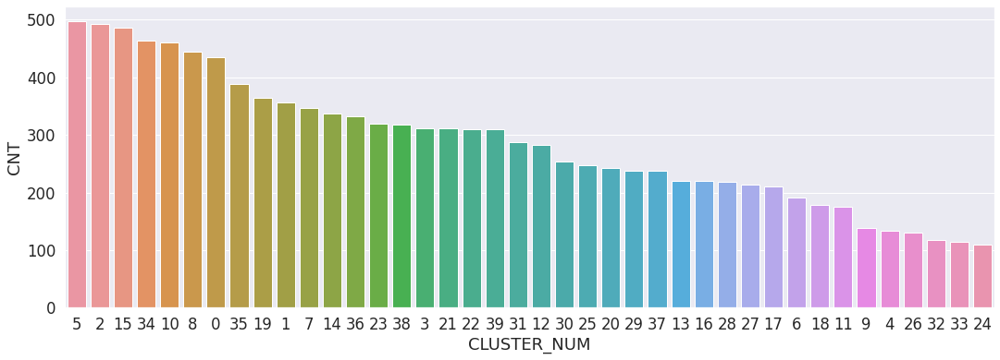

In [28]:
plt.figure(figsize=(18, 6))
sns.set_theme(font_scale=1.5,)
sns.barplot(x='CLUSTER_NUM', 
            y='CNT', 
            data=cluster_size,
            order=cluster_size['CLUSTER_NUM'].values)

## Heatmap

In [29]:
ndf = ndf.loc[ndf['SEMESTER'].apply(lambda x: x not in ['S103-1', 'S103-2', 'S104-1', 'S104-2'])]

In [30]:
plot_data = ndf.groupby(['SEMESTER', 'CLUSTER_NUM']).size().reset_index(name='CNT').pivot('SEMESTER', 'CLUSTER_NUM', 'CNT').fillna(0)
plot_data.head()

CLUSTER_NUM,0,1,2,3,4,5,6,7,8,9,...,30,31,32,33,34,35,36,37,38,39
SEMESTER,,,,,,,,,,,,,,,,,,,,,
S105-1,26.0,14.0,9.0,20.0,5.0,38.0,7.0,19.0,6.0,10.0,...,16.0,22.0,5.0,1.0,14.0,13.0,11.0,21.0,22.0,24.0
S105-2,31.0,32.0,7.0,30.0,11.0,55.0,8.0,22.0,9.0,6.0,...,19.0,32.0,10.0,4.0,30.0,11.0,34.0,9.0,22.0,29.0
S106-1,60.0,29.0,13.0,35.0,23.0,63.0,4.0,36.0,30.0,15.0,...,31.0,35.0,8.0,6.0,34.0,19.0,42.0,27.0,18.0,34.0
S106-2,37.0,27.0,12.0,28.0,8.0,42.0,6.0,24.0,22.0,4.0,...,13.0,25.0,5.0,3.0,26.0,20.0,31.0,13.0,21.0,29.0
S107-1,44.0,43.0,66.0,20.0,20.0,40.0,21.0,29.0,37.0,14.0,...,22.0,20.0,10.0,10.0,50.0,23.0,25.0,18.0,32.0,14.0


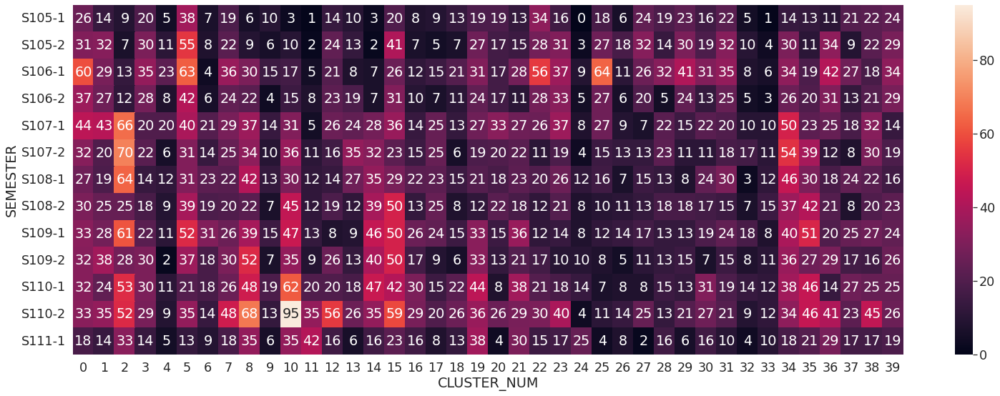

In [31]:
plt.figure(figsize=(26, 9))
sns.set(font_scale=1.6)
sns.heatmap(plot_data, annot=True,)

# WordCloud

## Segment

In [33]:
keywords_df = pd.read_csv('./dict/KEYWORDS.txt', header=None, sep='\t',
                       skiprows=[71, 84, 97, 190, 241, 253, 275, 276, 284, 305, 306, 320, 332, 352, 383, 393, 416, 422, 435, 461, 465, 471, 
                                 478, 481, 518, 527, 540, 541, 544, 604, 643, 655, 669, 678, 686, 723, 726, 744, 760, 774, 779 ,787, 798, 
                                 810, 811, 829, 855, 874, 878, 884, 885, 901, 903, 913, 918, 930, 932, 933, 934, 954, 988, 994, 
                                 1012, 1019, 1034, 1038, 1104, 1107, 1011, 1057, 1062, 1107, 1137, 1176, 1177, 1180, 1183, 1184, 1188, 1209, 1225, 
                                 1237, 1258, 1260, 1264, 1272, 1274, 1280, 1281, 1304, 1308, 1309, 1311, 1317, 1324, 1325, 1337, 1344, 1352, 1364, 
                                 1372, 1416, 1422, 1423, 1424, 1436, 1144, 1444, 1456, 1467, 1470, 1482, 1483, 1487, 1511, 1512, 1514, 1548, 1549, 
                                 1553, 1555, 1560, 1590, 1598, 1604, 1613, 1614, 1634, 1640, 1641, 1644, 1651, 1652, 1658, 1668, 1669, 1685, 1690, 
                                 1707, 1708, 1710, 1718, 1723, 1725, 1743, 1755, 1761, 1774, 1775, 1776, 1783, 1793, 1794, 1799, 1806, 1816, 1819, 
                                 1823, 1827, 1842, 1856, 1882, 1890, 1907, 1933, 1937, 1963, 1989, 1916, 1962, 1991, 1997, 2004, 2015, 2016, 2019, 
                                 2026, 2048, 2055, 2071, 2075, 2076, 2084, 2085, 2090, 2093, 2094, 2097, 2098, 2099, 2106, 2144, 2151, 2161, 2183, 
                                 2192, 2203, 2204, 2212, 2214, 2228, 2229, 2231, 2232, 2240, 2244, 2249, 2251, 2267, 2277, 2290, 2312, 2319, 2320, 
                                 2328, 2334, 2336, 2338, 2353, 2355, 2369, 2367, 2385, 2396, 2400, 2403, 2415, 2416, 2434, 2440, 2454, 2465, 2471, 
                                 2484, 2490, 2495, 2507, 2520, 2528, 2543, 2555, 2566, 2592, 2593, 2594, 2621, 2624, 2628, 2631, 2634]
                         )
keywords_df.columns = ['kw', 'freq']
keywords_df['kw'] = keywords_df['kw'].apply(lambda x: x.upper())
print(keywords_df.shape)
keywords_df.head()

(2399, 2)


,kw,freq
0,可以,2700
1,我們,2680
2,沒有,2264
3,同學,2036
4,大家,1956


In [34]:
jieba.initialize()

for kw, freq in zip(keywords_df['kw'], keywords_df['freq']):
    jieba.add_word(kw, freq)

for key in udf_dict:
    for kw in udf_dict[key]:
        jieba.add_word(kw)

Building prefix dict from the default dictionary ...
DEBUG:jieba:Building prefix dict from the default dictionary ...
Dumping model to file cache /tmp/jieba.cache
DEBUG:jieba:Dumping model to file cache /tmp/jieba.cache
Loading model cost 0.997 seconds.
DEBUG:jieba:Loading model cost 0.997 seconds.
Prefix dict has been built successfully.
DEBUG:jieba:Prefix dict has been built successfully.


In [35]:
print(ndf.shape)

# Keep only chinese, english and numbers 
ndf['SEG_MESSAGE'] = ndf['MESSAGE'].apply(lambda x: re.sub('[^\u4e00-\u9fa5_A-Za-z0-9]', ' ', x))
ndf['SEG_MESSAGE'] = ndf['SEG_MESSAGE'].apply(lambda x: jieba.lcut(x))

ndf['SEG_MESSAGE'] = ndf['SEG_MESSAGE'].apply(lambda x: [i for i in x if i != ' '])

# keep length more than 2
# ndf = ndf.loc[ndf['SEG_MESSAGE'].apply(lambda x: len(x)>=5)]

# reset index
ndf = ndf.reset_index(drop=True).reset_index()
ndf = ndf.rename({'index':'INDEX'}, axis=1)

print(ndf.shape)
ndf.head()

(11390, 7)
(11390, 9)


,INDEX,NAME,POSTID,TIME,SEMESTER,MESSAGE,DOC_VECTORS,CLUSTER_NUM,SEG_MESSAGE
0,0,黑特東華 NDHU Hate,489679074570758,2016-08-22 13:32:05,S105-1,#新投稿網址：HTTPS ===============【歡慶重新開張】==========...,"[0.0123590445, 0.034483675, 0.027585924, -0.04...",20,"[新, 投稿, 網址, HTTPS, 歡慶, 重新, 開張, 嗨, 各位, 東華, 的, 同..."
1,1,黑特東華 NDHU Hate,489905007881498,2016-08-23 01:21:32,S105-1,哈囉~ 大家好~~ 各位有玩POKEMON GO的東華玩家快點照過來吧~~ 快來加入我們的社...,"[-0.007877241, 0.0042184927, 0.0059408816, -0....",38,"[哈囉, 大家好, 各位, 有, 玩, PO, KEM, ON, GO, 的, 東華, 玩家..."
2,2,黑特東華 NDHU Hate,490171744521491,2016-08-23 17:18:18,S105-1,咦～教育與潛能開發學系應該要簡稱為「教潛系」吧！！！！！ 教育系應該是教行系跟「教潛系」兩者...,"[0.017824866, -0.021401653, -0.026543088, -0.0...",12,"[咦, 教育與潛能開發學系, 應該, 要, 簡, 稱為, 教潛系, 吧, 教育系, 應該, ..."
3,3,黑特東華 NDHU Hate,490970554441610,2016-08-25 17:11:10,S105-1,[非黑特] 上一篇好像被系統吃文了 ( 想請問現在學校裡的超商有開嗎?因為有事先回學校短期住...,"[-0.009055664, 0.007731006, -0.023193238, -0.0...",19,"[非黑特, 上一篇, 好像, 被, 系統, 吃文, 了, 想請問, 現在, 學校, 裡的, ..."
4,4,黑特東華 NDHU Hate,490970594441606,2016-08-25 17:11:13,S105-1,哈囉~ 大家好!! 經過漫長的暑假 有沒有感覺電腦稍稍變慢了啊!? 還是打算升級一下自己的電...,"[0.024557978, -0.001270016, 0.012720584, -0.04...",20,"[哈囉, 大家好, 經過, 漫長, 的, 暑假, 有沒有, 感覺, 電腦, 稍稍, 變慢, ..."


In [50]:
def plot_wordcloud(word_dict):
    wordcloud =  WordCloud(font_path='./font/msjh.ttc',
                           width=1000,
                           height=700,
                           max_words=80,
                           min_font_size=3,
                           background_color="white")
    wordcloud = wordcloud.generate_from_frequencies(word_dict)
    plt.figure(figsize=(9, 6), dpi=160)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.grid(None)
    plt.axis("off")

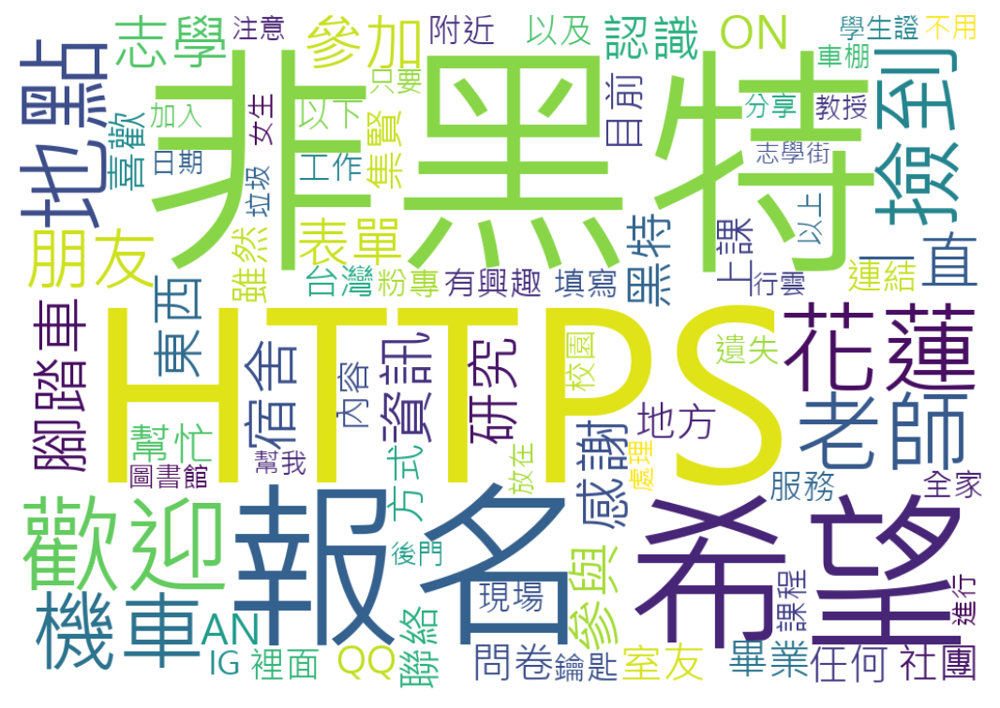

In [51]:
# 不分類的文字雲
wc_dict = ndf['SEG_MESSAGE'].explode('SEG_MESSAGE').value_counts().reset_index()
wc_dict = wc_dict.loc[wc_dict['index'].apply(lambda x: len(x)>=2)]
wc_dict = wc_dict.loc[wc_dict['index'].apply(lambda x: x not in stop_words)]
wc_dict = wc_dict.set_index('index').to_dict()['SEG_MESSAGE']
plot_wordcloud(wc_dict)

## TFIDF

In [52]:
ndf['SEG_MESSAGE'] = ndf['SEG_MESSAGE'].apply(lambda x: ' '.join(x))
ndf2 = ndf.groupby('CLUSTER_NUM')['SEG_MESSAGE'].apply(lambda x: ' '.join(x)).reset_index()
vectorizer = TfidfVectorizer(min_df=10, stop_words=stop_words, max_features=5000)
X = vectorizer.fit_transform(ndf2['SEG_MESSAGE'])
X.shape

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['in', 'le'] not in stop_words.
  % sorted(inconsistent)


(40, 2802)

In [53]:
tfidf_df = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out()).stack().reset_index()
tfidf_df.columns = ['CLUSTER_NUM', 'TFIDF_KWS', 'VALUE']
tfidf_df = tfidf_df.loc[tfidf_df['VALUE']!=0]
tfidf_df = tfidf_df.sort_values(['CLUSTER_NUM', 'VALUE'], ascending=[True, False])
tfidf_df = tfidf_df.groupby('CLUSTER_NUM').head(100)
tfidf_df

,CLUSTER_NUM,TFIDF_KWS,VALUE
2720,0,非黑特,0.380339
2238,0,花蓮,0.224321
1027,0,宿舍,0.152275
530,0,八卦,0.139583
103,0,qq,0.130024
...,...,...,...
111827,39,進去,0.047392
111232,39,白色,0.046409
111601,39,解釋,0.046409
110040,39,問問,0.046165


## Plot

(1384, 9)


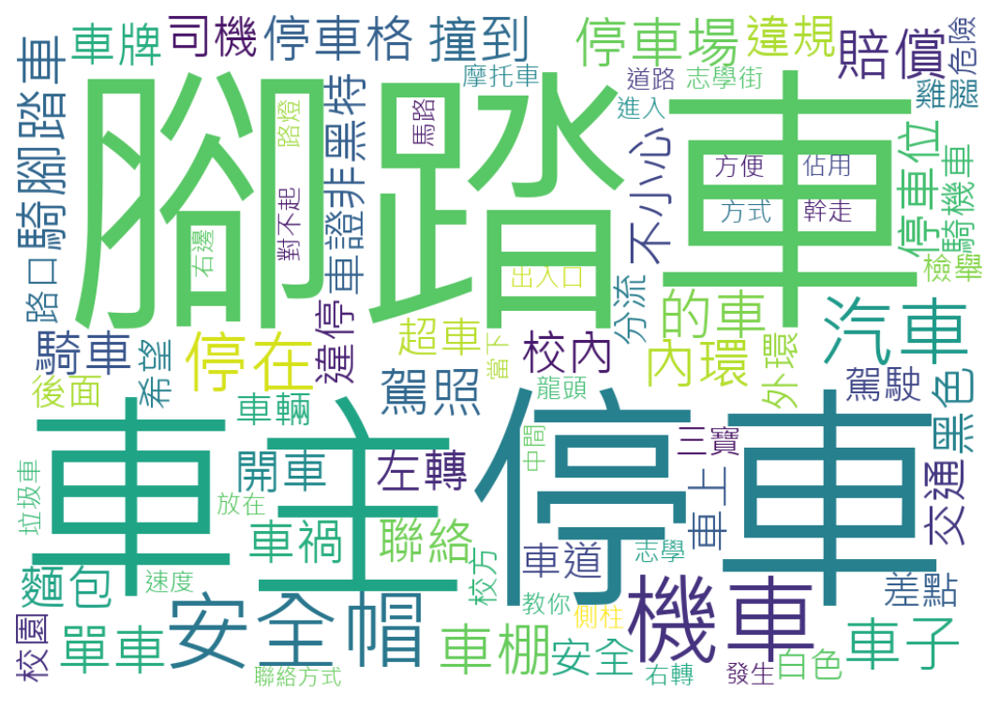

In [54]:
print(ndf.loc[ndf['CLUSTER_NUM'].apply(lambda x: x in [19, 30, 37, 16, 21])].shape)
plot_df = tfidf_df.loc[tfidf_df['CLUSTER_NUM'].apply(lambda x: x in [19, 30, 37, 16, 21])]
word_dict = plot_df.groupby('TFIDF_KWS')['VALUE'].max().to_dict()
plot_wordcloud(word_dict)

(977, 9)


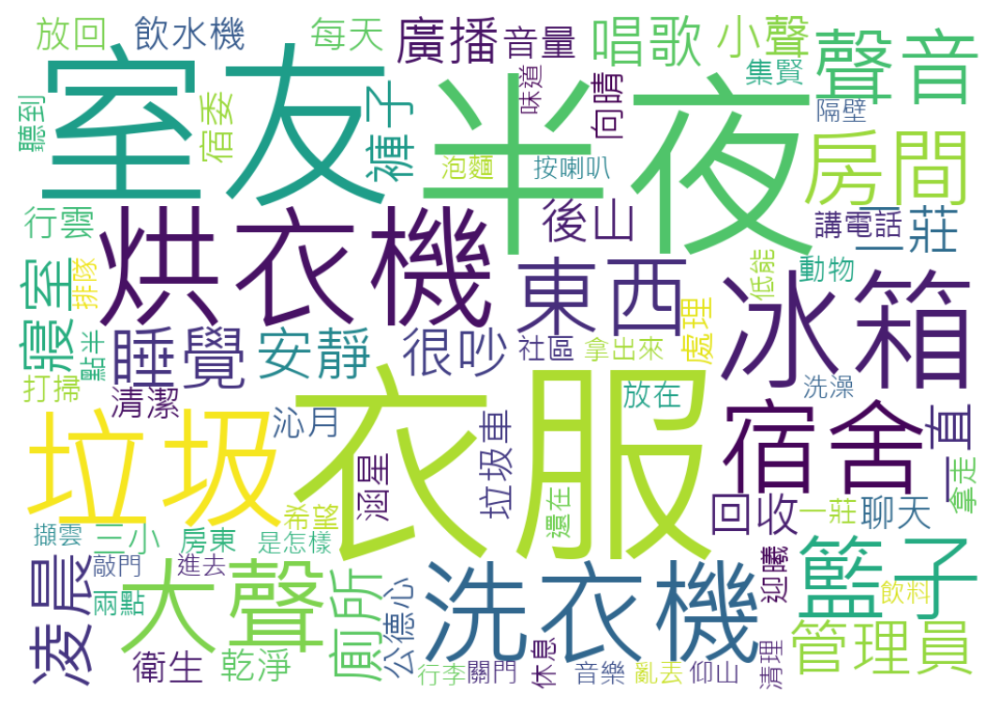

In [55]:
print(ndf.loc[ndf['CLUSTER_NUM'].apply(lambda x: x in [3, 9, 22, 28])].shape)
plot_df = tfidf_df.loc[tfidf_df['CLUSTER_NUM'].apply(lambda x: x in [3, 9, 22, 28])]
word_dict = plot_df.groupby('TFIDF_KWS')['VALUE'].max().to_dict()
plot_wordcloud(word_dict)

(451, 9)


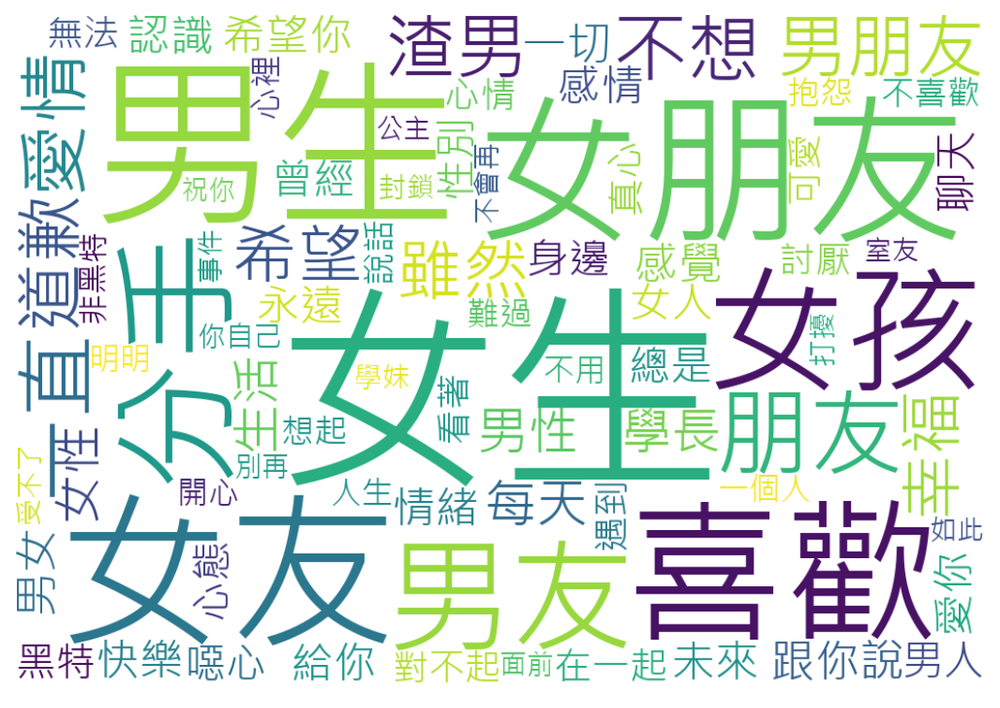

In [56]:
print(ndf.loc[ndf['CLUSTER_NUM'].apply(lambda x: x in [27, 29])].shape)
plot_df = tfidf_df.loc[tfidf_df['CLUSTER_NUM'].apply(lambda x: x in [27, 29])]
word_dict = plot_df.groupby('TFIDF_KWS')['VALUE'].max().to_dict()
plot_wordcloud(word_dict)

(238, 9)


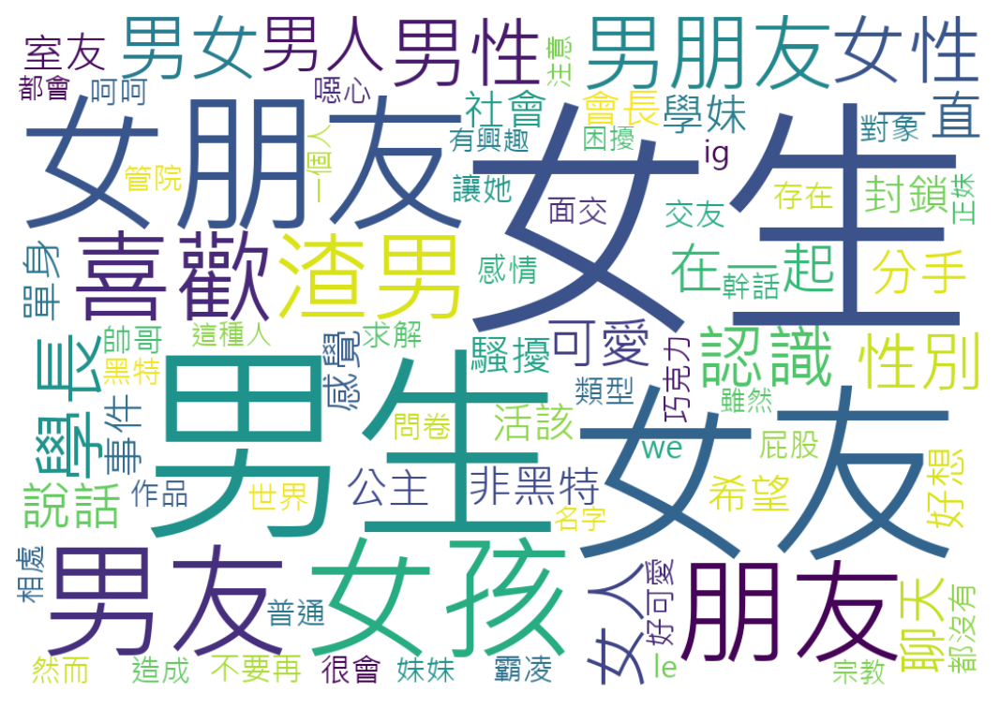

In [57]:
print(ndf.loc[ndf['CLUSTER_NUM'].apply(lambda x: x in [29])].shape)
plot_df = tfidf_df.loc[tfidf_df['CLUSTER_NUM'].apply(lambda x: x in [29])]
word_dict = plot_df.groupby('TFIDF_KWS')['VALUE'].max().to_dict()
plot_wordcloud(word_dict)

# Overview - SubPlot

0 0
0 1
0 2
0 3
0 4
1 0
1 1
1 2
1 3
1 4
2 0
2 1
2 2
2 3
2 4
3 0
3 1
3 2
3 3
3 4
4 0
4 1
4 2
4 3
4 4
5 0
5 1
5 2
5 3
5 4
6 0
6 1
6 2
6 3
6 4
7 0
7 1
7 2
7 3
7 4


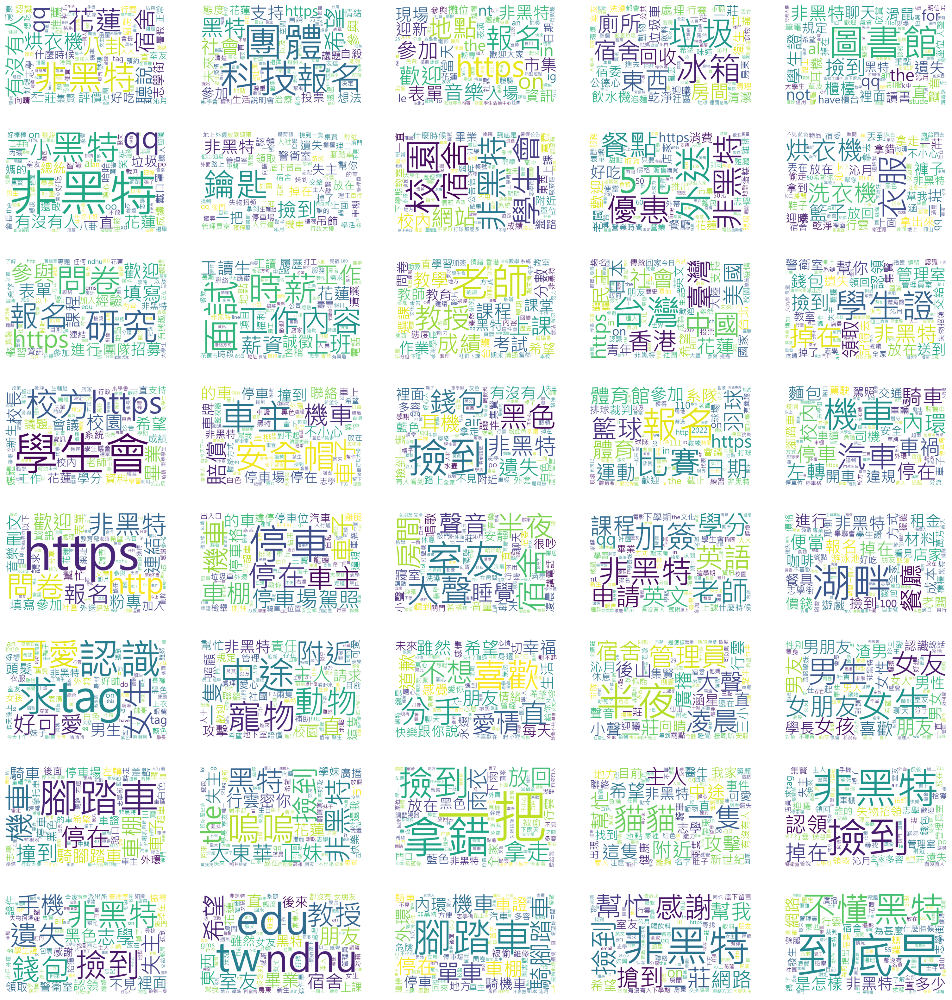

In [59]:
num_rows = 8
num_cols = 5
clu_wc = 0

fig, ax = plt.subplots(num_rows, num_cols, figsize=(24, 26), dpi=160)
for nr in list(range(num_rows)):
    for nc in list(range(num_cols)):
        plot_df = tfidf_df.loc[tfidf_df['CLUSTER_NUM'].apply(lambda x: x in [clu_wc])]
        word_dict = plot_df.groupby('TFIDF_KWS')['VALUE'].max().to_dict()
        wordcloud =  WordCloud(font_path='./font/msjh.ttc',
                               width=800,
                               height=500,
                               max_words=80,
                               min_font_size=3,
                               background_color="white").generate_from_frequencies(word_dict)
        ax[nr][nc].axis("off")
        ax[nr][nc].imshow(wordcloud, interpolation="bilinear")
        print(nr, nc)
        clu_wc +=1
plt.show()